# Analysis of 3k T cells from cancer

In [1]:
%load_ext autoreload
%autoreload 2
import sys

sys.path.insert(0, "../..")
import scirpy as ir
import pandas as pd
import numpy as np
import scanpy as sc
from matplotlib import pyplot as plt
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.3 umap==0.4.3 numpy==1.18.5 scipy==1.4.1 pandas==1.0.4 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.0


/opt/hostedtoolcache/Python/3.7.7/x64/lib/python3.7/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [3]:
adata = ir.datasets.wu2020_3k()

wu2020_3k.h5ad: 0.00B [00:00, ?B/s]

wu2020_3k.h5ad:   0%|          | 8.19k/28.7M [00:00<13:36, 35.2kB/s]

wu2020_3k.h5ad:  35%|███▌      | 10.1M/28.7M [00:00<06:11, 50.2kB/s]

wu2020_3k.h5ad:  79%|███████▉  | 22.8M/28.7M [00:00<01:22, 71.7kB/s]

wu2020_3k.h5ad: 28.7MB [00:00, 58.0MB/s]                            

In [4]:
adata.shape

(3000, 30727)

In [5]:
adata.obs

,TRA_1_c_gene,TRA_1_cdr3,TRA_1_cdr3_nt,TRA_1_d_gene,TRA_1_expr,TRA_1_j_gene,TRA_1_junction_ins,TRA_1_v_gene,TRA_2_c_gene,TRA_2_cdr3,...,TRB_2_junction_ins,TRB_2_v_gene,batch,clonotype_orig,cluster_orig,has_tcr,multi_chain,patient,sample,source
LN1_GTAGGCCAGCGTAGTG-1-19,None,None,None,None,NaN,None,None,None,None,None,...,None,TRBV12-3,19,lung1.tn.C223,4.4-FOS,True,False,Lung1,LN1,NAT
RN2_AGAGCGACAGATTGCT-1-27,TRAC,CAVRGNNNARLMF,TGTGCTGTGAGGGGGAATAACAATGCCAGACTCATGTTT,None,1.0,TRAJ31,None,TRAV8-6,None,None,...,None,None,27,renal2.tnb.C1362,4.4-FOS,True,False,Renal2,RN2,NAT
LN1_GTCATTTCAATGAAAC-1-19,TRAC,CAVRLGNQFYF,TGTGCTGTGAGGTTGGGTAACCAGTTCTATTTT,None,2.0,TRAJ49,None,TRAV21,None,None,...,None,None,19,lung1.tn.C25,8.2-Tem,True,False,Lung1,LN1,NAT
LN2_GACACGCAGGTAGCTG-2-2,None,None,None,None,NaN,None,None,None,None,None,...,None,None,2,lung2.tn.C2452,8.6-KLRB1,True,False,Lung2,LN2,NAT
LN2_GCACTCTCAGGGATTG-2-2,TRAC,CAASDPTVEAGTALIF,TGTGCAGCAAGCGACCCCACGGTCGAGGCAGGAACTGCTCTGATCTTT,None,4.0,TRAJ15,None,TRAV23DV6,None,None,...,None,None,2,lung2.tn.C5631,4.4-FOS,True,False,Lung2,LN2,NAT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RT3_GCAGTTAGTATGAAAC-1-6,TRAC,CAAMDSNYQLIW,TGTGCTGCGATGGATAGCAACTATCAGTTAATCTGG,None,1.0,TRAJ33,None,TRAV1-2,None,None,...,None,None,6,renal3.tnb.C176,4.2-RPL32,True,False,Renal3,RT3,Tumor
LT1_GACGTGCTCTCAAGTG-1-24,TRAC,CAYRSSLGGATNKLIF,TGTGCTTATAGGAGTTCCCTTGGTGGTGCTACAAACAAGCTCATCTTT,None,1.0,TRAJ32,None,TRAV38-2DV8,None,None,...,None,None,24,lung1.tn.C151,8.2-Tem,True,False,Lung1,LT1,Tumor
ET3_GCTGGGTAGACCTTTG-1-3,None,None,None,None,NaN,None,None,None,None,None,...,None,None,3,endo3.tn.C76,3.1-MT,True,False,Endo3,ET3,Tumor
RT1_TAAGAGATCCTTAATC-1-8,TRAC,CAMSEISGGYNKLIF,TGTGCAATGAGCGAGATTTCTGGTGGCTACAATAAGCTGATTTTT,None,5.0,TRAJ4,None,TRAV12-3,None,None,...,None,None,8,renal1.tnb.C83,4.5-IL6ST,True,False,Renal1,RT1,Tumor


## Preprocess Transcriptomics data

Transcriptomics data needs to be filtered and preprocessed as with any other single-cell dataset.
We recommend following the [scanpy tutorial](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)
and the best practice paper by [Luecken et al.](https://www.embopress.org/doi/10.15252/msb.20188746)

In [6]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.filter_cells(adata, min_genes=100)

In [7]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1000)
sc.pp.log1p(adata)

For the _Wu2020_ dataset, the authors already provide clusters and UMAP coordinates.
Instead of performing clustering and cluster annotation ourselves, we will just use
the provided data. The clustering and annotation methodology is 
described in [their paper](https://doi.org/10.1038/s41586-020-2056-8). 

In [8]:
adata.obsm["X_umap"] = adata.obsm["X_umap_orig"]

In [9]:
mapping = {
    "3.1-MT": "other",
    "4.1-Trm": "CD4_Trm",
    "4.2-RPL32": "CD4_RPL32",
    "4.3-TCF7": "CD4_TCF7",
    "4.4-FOS": "CD4_FOSS",
    "4.5-IL6ST": "CD4_IL6ST",
    "4.6a-Treg": "CD4_Treg",
    "4.6b-Treg": "CD4_Treg",
    "8.1-Teff": "CD8_Teff",
    "8.2-Tem": "CD8_Tem",
    "8.3a-Trm": "CD8_Trm",
    "8.3b-Trm": "CD8_Trm",
    "8.3c-Trm": "CD8_Trm",
    "8.4-Chrom": "other",
    "8.5-Mitosis": "other",
    "8.6-KLRB1": "other",
}
adata.obs["cluster"] = [mapping[x] for x in adata.obs["cluster_orig"]]

Let's inspect the UMAP plots. The first three panels show the UMAP plot colored by sample, patient and cluster.
We don't observe any clustering of samples or patients that could hint at batch effects.

The last three panels show the UMAP colored by the T cell markers _CD8_, _CD4_, and _FOXP3_.
We can confirm that the markers correspond to their respective cluster labels.

In [10]:
sc.pl.umap(
    adata,
    color=["sample", "patient", "cluster", "CD8A", "CD4", "FOXP3"],
    ncols=2,
    wspace=0.5,
)

... storing 'cluster' as categorical


## TCR Quality Control

In [11]:
ir.tl.chain_pairing(adata)

... storing 'chain_pairing' as categorical


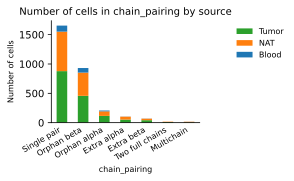

In [12]:
ir.pl.group_abundance(
    adata, groupby="chain_pairing", target_col="source",
)

Indeed, in this dataset, ~6% of cells have more than 
one pair of productive T-cell receptors:

In [13]:
print(
    "Fraction of cells with more than one pair of TCRs: {:.2f}".format(
        np.sum(
            adata.obs["chain_pairing"].isin(
                ["Extra beta", "Extra alpha", "Two full chains"]
            )
        )
        / adata.n_obs
    )
)

Fraction of cells with more than one pair of TCRs: 0.06


Next, we visualize the _Multichain_ cells on the UMAP plot and exclude them from downstream analysis:

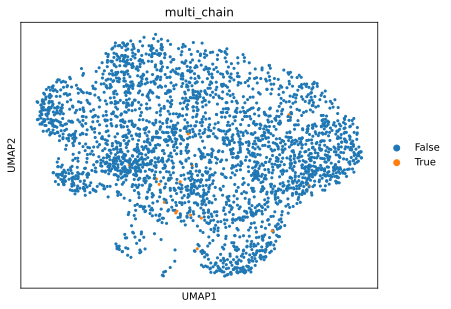

In [14]:
sc.pl.umap(adata, color="multi_chain")

In [15]:
adata = adata[adata.obs["multi_chain"] != "True", :].copy()

## Define clonotypes and clonotype clusters

### Compute CDR3 neighborhood graph and define clonotypes

In [16]:
# using default parameters, `tcr_neighbors` will compute nucleotide sequence identity
ir.pp.tcr_neighbors(adata, receptor_arms="all", dual_tcr="primary_only")
ir.tl.define_clonotypes(adata)

  0%|          | 0/1643 [00:00<?, ?it/s]

100%|██████████| 1643/1643 [00:00<00:00, 79252.49it/s]


  0%|          | 0/2186 [00:00<?, ?it/s]

100%|██████████| 2186/2186 [00:00<00:00, 76241.68it/s]


  0%|          | 0/8887 [00:00<?, ?it/s]

 75%|███████▌  | 6675/8887 [00:00<00:00, 66748.95it/s]

100%|██████████| 8887/8887 [00:00<00:00, 71035.17it/s]

... storing 'clonotype' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4275dbe0d0>],
      dtype=object)

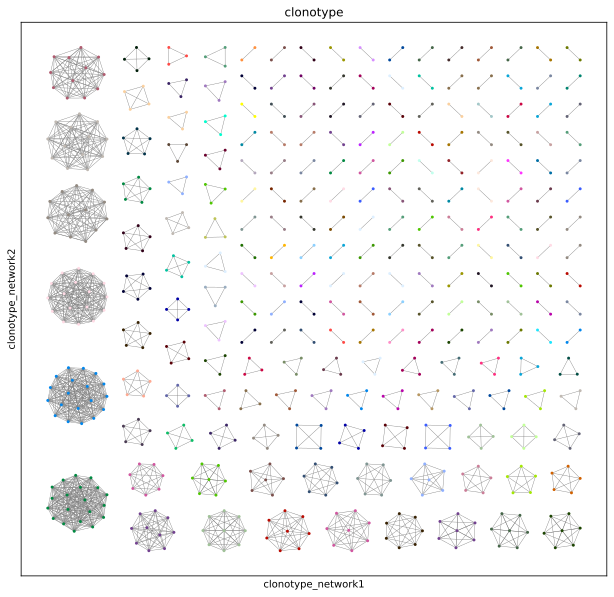

In [17]:
ir.tl.clonotype_network(adata, min_size=2)
ir.pl.clonotype_network(adata, color="clonotype", legend_loc="none")

### Re-compute CDR3 neighborhood graph and define clonotype clusters

In [18]:
sc.settings.verbosity = 4

In [19]:
ir.pp.tcr_neighbors(
    adata,
    metric="alignment",
    sequence="aa",
    cutoff=15,
    receptor_arms="all",
    dual_tcr="all",
)
ir.tl.define_clonotype_clusters(
    adata, partitions="connected", sequence="aa", metric="alignment"
)

Initializing TcrNeighbors object...


Finished initalizing TcrNeighbors object.  (0:00:00)


Computing TRA pairwise distances...


  0%|          | 0/1698 [00:00<?, ?it/s]

  0%|          | 4/1698 [00:00<00:44, 37.76it/s]

  1%|          | 9/1698 [00:00<00:43, 38.67it/s]

  1%|          | 14/1698 [00:00<00:41, 40.67it/s]

  1%|          | 18/1698 [00:00<00:41, 40.32it/s]

  1%|▏         | 23/1698 [00:00<00:39, 42.70it/s]

  2%|▏         | 28/1698 [00:00<00:40, 41.29it/s]

  2%|▏         | 34/1698 [00:00<00:38, 42.72it/s]

  2%|▏         | 40/1698 [00:00<00:38, 43.59it/s]

  3%|▎         | 46/1698 [00:01<00:37, 44.46it/s]

  3%|▎         | 51/1698 [00:01<00:36, 45.46it/s]

  3%|▎         | 56/1698 [00:01<00:36, 45.51it/s]

  4%|▎         | 61/1698 [00:01<00:36, 45.08it/s]

  4%|▍         | 67/1698 [00:01<00:36, 44.82it/s]

  4%|▍         | 72/1698 [00:01<00:35, 45.56it/s]

  5%|▍         | 77/1698 [00:01<00:36, 44.44it/s]

  5%|▍         | 82/1698 [00:01<00:35, 45.73it/s]

  5%|▌         | 87/1698 [00:01<00:35, 44.94it/s]

  5%|▌         | 92/1698 [00:02<00:35, 45.57it/s]

  6%|▌         | 97/1698 [00:02<00:36, 43.87it/s]

  6%|▌         | 103/1698 [00:02<00:35, 45.13it/s]

  6%|▋         | 109/1698 [00:02<00:34, 45.81it/s]

  7%|▋         | 114/1698 [00:02<00:33, 46.67it/s]

  7%|▋         | 119/1698 [00:02<00:33, 47.28it/s]

  7%|▋         | 124/1698 [00:02<00:33, 47.03it/s]

  8%|▊         | 130/1698 [00:02<00:33, 47.25it/s]

  8%|▊         | 135/1698 [00:02<00:32, 47.74it/s]

  8%|▊         | 140/1698 [00:03<00:34, 45.70it/s]

  9%|▊         | 146/1698 [00:03<00:33, 46.40it/s]

  9%|▉         | 151/1698 [00:03<00:32, 46.97it/s]

  9%|▉         | 156/1698 [00:03<00:32, 46.90it/s]

  9%|▉         | 161/1698 [00:03<00:33, 45.46it/s]

 10%|▉         | 167/1698 [00:03<00:33, 46.12it/s]

 10%|█         | 173/1698 [00:03<00:32, 47.29it/s]

 11%|█         | 179/1698 [00:03<00:31, 48.17it/s]

 11%|█         | 185/1698 [00:04<00:30, 48.89it/s]

 11%|█         | 190/1698 [00:04<00:31, 48.19it/s]

 12%|█▏        | 196/1698 [00:04<00:30, 48.55it/s]

 12%|█▏        | 202/1698 [00:04<00:30, 48.37it/s]

 12%|█▏        | 208/1698 [00:04<00:30, 48.94it/s]

 13%|█▎        | 214/1698 [00:04<00:30, 49.32it/s]

 13%|█▎        | 219/1698 [00:04<00:30, 49.30it/s]

 13%|█▎        | 225/1698 [00:04<00:29, 49.47it/s]

 14%|█▎        | 231/1698 [00:04<00:29, 49.67it/s]

 14%|█▍        | 237/1698 [00:05<00:29, 49.58it/s]

 14%|█▍        | 243/1698 [00:05<00:28, 50.85it/s]

 15%|█▍        | 249/1698 [00:05<00:28, 51.26it/s]

 15%|█▌        | 255/1698 [00:05<00:28, 51.18it/s]

 15%|█▌        | 261/1698 [00:05<00:27, 51.57it/s]

 16%|█▌        | 267/1698 [00:05<00:28, 50.18it/s]

 16%|█▌        | 273/1698 [00:05<00:27, 51.92it/s]

 16%|█▋        | 279/1698 [00:05<00:27, 52.01it/s]

 17%|█▋        | 285/1698 [00:06<00:27, 52.15it/s]

 17%|█▋        | 291/1698 [00:06<00:27, 52.01it/s]

 17%|█▋        | 297/1698 [00:06<00:26, 52.30it/s]

 18%|█▊        | 303/1698 [00:06<00:26, 52.54it/s]

 18%|█▊        | 309/1698 [00:06<00:26, 52.82it/s]

 19%|█▊        | 315/1698 [00:06<00:27, 50.10it/s]

 19%|█▉        | 321/1698 [00:06<00:26, 51.12it/s]

 19%|█▉        | 327/1698 [00:06<00:26, 52.00it/s]

 20%|█▉        | 333/1698 [00:06<00:25, 52.65it/s]

 20%|█▉        | 339/1698 [00:07<00:25, 53.30it/s]

 20%|██        | 345/1698 [00:07<00:25, 53.37it/s]

 21%|██        | 351/1698 [00:07<00:24, 54.07it/s]

 21%|██        | 357/1698 [00:07<00:24, 54.38it/s]

 21%|██▏       | 363/1698 [00:07<00:24, 53.79it/s]

 22%|██▏       | 369/1698 [00:07<00:24, 54.37it/s]

 22%|██▏       | 375/1698 [00:07<00:24, 54.35it/s]

 22%|██▏       | 381/1698 [00:07<00:23, 55.43it/s]

 23%|██▎       | 387/1698 [00:07<00:23, 56.29it/s]

 23%|██▎       | 393/1698 [00:08<00:23, 55.71it/s]

 23%|██▎       | 399/1698 [00:08<00:24, 53.78it/s]

 24%|██▍       | 405/1698 [00:08<00:23, 54.65it/s]

 24%|██▍       | 411/1698 [00:08<00:23, 55.10it/s]

 25%|██▍       | 417/1698 [00:08<00:22, 55.82it/s]

 25%|██▍       | 423/1698 [00:08<00:22, 56.35it/s]

 25%|██▌       | 429/1698 [00:08<00:22, 55.82it/s]

 26%|██▌       | 435/1698 [00:08<00:22, 56.56it/s]

 26%|██▌       | 441/1698 [00:08<00:22, 57.13it/s]

 26%|██▋       | 448/1698 [00:09<00:21, 57.39it/s]

 27%|██▋       | 454/1698 [00:09<00:21, 57.85it/s]

 27%|██▋       | 460/1698 [00:09<00:21, 58.42it/s]

 28%|██▊       | 467/1698 [00:09<00:20, 60.15it/s]

 28%|██▊       | 474/1698 [00:09<00:20, 59.69it/s]

 28%|██▊       | 481/1698 [00:09<00:20, 60.23it/s]

 29%|██▊       | 488/1698 [00:09<00:19, 60.66it/s]

 29%|██▉       | 495/1698 [00:09<00:20, 59.91it/s]

 30%|██▉       | 502/1698 [00:09<00:19, 61.92it/s]

 30%|██▉       | 509/1698 [00:10<00:19, 60.48it/s]

 30%|███       | 516/1698 [00:10<00:18, 62.63it/s]

 31%|███       | 523/1698 [00:10<00:19, 60.58it/s]

 31%|███       | 530/1698 [00:10<00:19, 61.08it/s]

 32%|███▏      | 537/1698 [00:10<00:18, 62.20it/s]

 32%|███▏      | 544/1698 [00:10<00:18, 62.09it/s]

 32%|███▏      | 551/1698 [00:10<00:17, 64.12it/s]

 33%|███▎      | 558/1698 [00:10<00:18, 61.88it/s]

 33%|███▎      | 566/1698 [00:10<00:17, 63.38it/s]

 34%|███▎      | 573/1698 [00:11<00:17, 65.13it/s]

 34%|███▍      | 580/1698 [00:11<00:17, 65.29it/s]

 35%|███▍      | 587/1698 [00:11<00:17, 65.27it/s]

 35%|███▌      | 595/1698 [00:11<00:16, 65.56it/s]

 36%|███▌      | 603/1698 [00:11<00:16, 65.60it/s]

 36%|███▌      | 611/1698 [00:11<00:16, 66.27it/s]

 36%|███▋      | 619/1698 [00:11<00:16, 66.59it/s]

 37%|███▋      | 627/1698 [00:11<00:15, 67.56it/s]

 37%|███▋      | 635/1698 [00:11<00:15, 68.25it/s]

 38%|███▊      | 643/1698 [00:12<00:15, 68.50it/s]

 38%|███▊      | 651/1698 [00:12<00:15, 69.17it/s]

 39%|███▉      | 659/1698 [00:12<00:14, 70.11it/s]

 39%|███▉      | 667/1698 [00:12<00:14, 70.90it/s]

 40%|███▉      | 675/1698 [00:12<00:14, 71.28it/s]

 40%|████      | 683/1698 [00:12<00:14, 71.74it/s]

 41%|████      | 691/1698 [00:12<00:14, 71.62it/s]

 41%|████      | 699/1698 [00:12<00:13, 72.62it/s]

 42%|████▏     | 707/1698 [00:12<00:13, 73.60it/s]

 42%|████▏     | 715/1698 [00:13<00:13, 72.78it/s]

 43%|████▎     | 723/1698 [00:13<00:13, 73.14it/s]

 43%|████▎     | 731/1698 [00:13<00:13, 73.71it/s]

 44%|████▎     | 739/1698 [00:13<00:13, 73.08it/s]

 44%|████▍     | 747/1698 [00:13<00:12, 74.72it/s]

 44%|████▍     | 755/1698 [00:13<00:12, 74.43it/s]

 45%|████▍     | 763/1698 [00:13<00:12, 75.99it/s]

 45%|████▌     | 772/1698 [00:13<00:12, 76.16it/s]

 46%|████▌     | 780/1698 [00:13<00:12, 75.07it/s]

 46%|████▋     | 788/1698 [00:14<00:12, 75.39it/s]

 47%|████▋     | 796/1698 [00:14<00:11, 76.52it/s]

 47%|████▋     | 804/1698 [00:14<00:11, 77.26it/s]

 48%|████▊     | 813/1698 [00:14<00:11, 79.69it/s]

 48%|████▊     | 822/1698 [00:14<00:11, 79.20it/s]

 49%|████▉     | 832/1698 [00:14<00:10, 81.04it/s]

 50%|████▉     | 841/1698 [00:14<00:10, 83.33it/s]

 50%|█████     | 850/1698 [00:14<00:10, 82.21it/s]

 51%|█████     | 859/1698 [00:14<00:10, 83.53it/s]

 51%|█████     | 869/1698 [00:14<00:09, 84.48it/s]

 52%|█████▏    | 879/1698 [00:15<00:09, 85.38it/s]

 52%|█████▏    | 889/1698 [00:15<00:09, 86.43it/s]

 53%|█████▎    | 898/1698 [00:15<00:09, 83.98it/s]

 53%|█████▎    | 908/1698 [00:15<00:09, 85.43it/s]

 54%|█████▍    | 918/1698 [00:15<00:08, 87.68it/s]

 55%|█████▍    | 928/1698 [00:15<00:08, 89.74it/s]

 55%|█████▌    | 938/1698 [00:15<00:08, 91.27it/s]

 56%|█████▌    | 948/1698 [00:15<00:08, 93.24it/s]

 56%|█████▋    | 959/1698 [00:15<00:07, 97.38it/s]

 57%|█████▋    | 970/1698 [00:16<00:07, 97.22it/s]

 58%|█████▊    | 981/1698 [00:16<00:07, 99.59it/s]

 58%|█████▊    | 992/1698 [00:16<00:07, 100.13it/s]

 59%|█████▉    | 1003/1698 [00:16<00:06, 100.47it/s]

 60%|█████▉    | 1015/1698 [00:16<00:06, 101.63it/s]

 60%|██████    | 1027/1698 [00:16<00:06, 104.64it/s]

 61%|██████    | 1039/1698 [00:16<00:06, 107.06it/s]

 62%|██████▏   | 1050/1698 [00:16<00:06, 107.65it/s]

 62%|██████▏   | 1061/1698 [00:16<00:06, 105.70it/s]

 63%|██████▎   | 1072/1698 [00:17<00:05, 106.74it/s]

 64%|██████▍   | 1083/1698 [00:17<00:05, 107.51it/s]

 64%|██████▍   | 1095/1698 [00:17<00:05, 110.53it/s]

 65%|██████▌   | 1107/1698 [00:17<00:05, 111.58it/s]

 66%|██████▌   | 1119/1698 [00:17<00:05, 113.51it/s]

 67%|██████▋   | 1131/1698 [00:17<00:04, 114.58it/s]

 67%|██████▋   | 1144/1698 [00:17<00:04, 117.44it/s]

 68%|██████▊   | 1158/1698 [00:17<00:04, 121.41it/s]

 69%|██████▉   | 1172/1698 [00:17<00:04, 124.90it/s]

 70%|██████▉   | 1187/1698 [00:17<00:03, 128.54it/s]

 71%|███████   | 1201/1698 [00:18<00:03, 130.62it/s]

 72%|███████▏  | 1217/1698 [00:18<00:03, 135.21it/s]

 73%|███████▎  | 1233/1698 [00:18<00:03, 139.75it/s]

 74%|███████▎  | 1249/1698 [00:18<00:03, 143.24it/s]

 74%|███████▍  | 1265/1698 [00:18<00:02, 146.58it/s]

 75%|███████▌  | 1281/1698 [00:18<00:02, 149.64it/s]

 76%|███████▋  | 1298/1698 [00:18<00:02, 154.28it/s]

 78%|███████▊  | 1317/1698 [00:18<00:02, 160.83it/s]

 79%|███████▊  | 1337/1698 [00:18<00:02, 168.05it/s]

 80%|███████▉  | 1357/1698 [00:19<00:01, 176.17it/s]

 81%|████████  | 1379/1698 [00:19<00:01, 185.60it/s]

 83%|████████▎ | 1402/1698 [00:19<00:01, 195.01it/s]

 84%|████████▍ | 1428/1698 [00:19<00:01, 207.26it/s]

 86%|████████▌ | 1455/1698 [00:19<00:01, 222.08it/s]

 87%|████████▋ | 1485/1698 [00:19<00:00, 238.05it/s]

 90%|████████▉ | 1520/1698 [00:19<00:00, 262.81it/s]

 92%|█████████▏| 1558/1698 [00:19<00:00, 289.04it/s]

 95%|█████████▍| 1611/1698 [00:19<00:00, 333.47it/s]

100%|██████████| 1698/1698 [00:19<00:00, 85.30it/s] 

Finished computing TRA pairwise distances. (0:00:20)


Computing TRB pairwise distances...


  0%|          | 0/2259 [00:00<?, ?it/s]

  0%|          | 3/2259 [00:00<01:28, 25.46it/s]

  0%|          | 7/2259 [00:00<01:21, 27.55it/s]

  0%|          | 11/2259 [00:00<01:16, 29.24it/s]

  1%|          | 15/2259 [00:00<01:13, 30.63it/s]

  1%|          | 19/2259 [00:00<01:10, 31.74it/s]

  1%|          | 23/2259 [00:00<01:08, 32.52it/s]

  1%|          | 26/2259 [00:00<01:10, 31.46it/s]

  1%|▏         | 30/2259 [00:00<01:09, 32.03it/s]

  2%|▏         | 34/2259 [00:01<01:09, 32.18it/s]

  2%|▏         | 38/2259 [00:01<01:07, 32.69it/s]

  2%|▏         | 42/2259 [00:01<01:06, 33.19it/s]

  2%|▏         | 46/2259 [00:01<01:05, 33.74it/s]

  2%|▏         | 50/2259 [00:01<01:05, 33.96it/s]

  2%|▏         | 54/2259 [00:01<01:04, 34.30it/s]

  3%|▎         | 58/2259 [00:01<01:05, 33.50it/s]

  3%|▎         | 62/2259 [00:01<01:04, 33.81it/s]

  3%|▎         | 66/2259 [00:01<01:04, 33.88it/s]

  3%|▎         | 70/2259 [00:02<01:03, 34.22it/s]

  3%|▎         | 74/2259 [00:02<01:03, 34.56it/s]

  3%|▎         | 78/2259 [00:02<01:02, 34.89it/s]

  4%|▎         | 82/2259 [00:02<01:02, 34.90it/s]

  4%|▍         | 86/2259 [00:02<01:01, 35.09it/s]

  4%|▍         | 90/2259 [00:02<01:01, 35.28it/s]

  4%|▍         | 94/2259 [00:02<01:01, 35.40it/s]

  4%|▍         | 98/2259 [00:02<01:01, 35.34it/s]

  5%|▍         | 102/2259 [00:03<01:02, 34.27it/s]

  5%|▍         | 106/2259 [00:03<01:02, 34.51it/s]

  5%|▍         | 110/2259 [00:03<01:02, 34.17it/s]

  5%|▌         | 114/2259 [00:03<01:02, 34.07it/s]

  5%|▌         | 118/2259 [00:03<01:03, 33.91it/s]

  5%|▌         | 122/2259 [00:03<01:02, 34.46it/s]

  6%|▌         | 126/2259 [00:03<01:01, 34.86it/s]

  6%|▌         | 130/2259 [00:03<01:00, 35.38it/s]

  6%|▌         | 134/2259 [00:03<01:00, 35.40it/s]

  6%|▌         | 138/2259 [00:04<00:59, 35.40it/s]

  6%|▋         | 142/2259 [00:04<01:00, 35.00it/s]

  6%|▋         | 146/2259 [00:04<01:01, 34.48it/s]

  7%|▋         | 150/2259 [00:04<01:01, 34.56it/s]

  7%|▋         | 154/2259 [00:04<01:01, 34.48it/s]

  7%|▋         | 158/2259 [00:04<01:00, 34.96it/s]

  7%|▋         | 162/2259 [00:04<00:59, 35.16it/s]

  7%|▋         | 166/2259 [00:04<00:59, 35.39it/s]

  8%|▊         | 170/2259 [00:04<00:59, 35.27it/s]

  8%|▊         | 174/2259 [00:05<00:59, 34.87it/s]

  8%|▊         | 178/2259 [00:05<00:59, 35.22it/s]

  8%|▊         | 182/2259 [00:05<00:59, 35.13it/s]

  8%|▊         | 186/2259 [00:05<00:59, 34.73it/s]

  8%|▊         | 190/2259 [00:05<00:58, 35.10it/s]

  9%|▊         | 194/2259 [00:05<00:58, 35.18it/s]

  9%|▉         | 198/2259 [00:05<00:58, 35.23it/s]

  9%|▉         | 202/2259 [00:05<00:58, 35.45it/s]

  9%|▉         | 206/2259 [00:05<00:57, 35.78it/s]

  9%|▉         | 210/2259 [00:06<00:57, 35.34it/s]

  9%|▉         | 214/2259 [00:06<00:57, 35.65it/s]

 10%|▉         | 218/2259 [00:06<00:57, 35.67it/s]

 10%|▉         | 222/2259 [00:06<00:56, 36.01it/s]

 10%|█         | 226/2259 [00:06<00:56, 36.11it/s]

 10%|█         | 230/2259 [00:06<00:55, 36.24it/s]

 10%|█         | 234/2259 [00:06<00:56, 35.67it/s]

 11%|█         | 238/2259 [00:06<00:55, 36.36it/s]

 11%|█         | 242/2259 [00:06<00:54, 36.74it/s]

 11%|█         | 246/2259 [00:07<00:54, 37.09it/s]

 11%|█         | 250/2259 [00:07<00:53, 37.51it/s]

 11%|█         | 254/2259 [00:07<00:53, 37.58it/s]

 11%|█▏        | 258/2259 [00:07<00:53, 37.63it/s]

 12%|█▏        | 262/2259 [00:07<00:52, 37.89it/s]

 12%|█▏        | 266/2259 [00:07<00:52, 38.14it/s]

 12%|█▏        | 270/2259 [00:07<00:51, 38.33it/s]

 12%|█▏        | 274/2259 [00:07<00:51, 38.32it/s]

 12%|█▏        | 278/2259 [00:07<00:51, 38.35it/s]

 12%|█▏        | 282/2259 [00:08<00:51, 38.41it/s]

 13%|█▎        | 286/2259 [00:08<00:51, 38.40it/s]

 13%|█▎        | 290/2259 [00:08<00:51, 38.54it/s]

 13%|█▎        | 294/2259 [00:08<00:52, 37.20it/s]

 13%|█▎        | 298/2259 [00:08<00:52, 37.36it/s]

 13%|█▎        | 302/2259 [00:08<00:51, 37.91it/s]

 14%|█▎        | 306/2259 [00:08<00:50, 38.43it/s]

 14%|█▎        | 310/2259 [00:08<00:50, 38.67it/s]

 14%|█▍        | 314/2259 [00:08<00:50, 38.29it/s]

 14%|█▍        | 318/2259 [00:08<00:50, 38.12it/s]

 14%|█▍        | 322/2259 [00:09<00:51, 37.43it/s]

 14%|█▍        | 326/2259 [00:09<00:50, 37.97it/s]

 15%|█▍        | 330/2259 [00:09<00:50, 38.16it/s]

 15%|█▍        | 334/2259 [00:09<00:50, 38.22it/s]

 15%|█▍        | 338/2259 [00:09<00:50, 38.37it/s]

 15%|█▌        | 342/2259 [00:09<00:51, 37.47it/s]

 15%|█▌        | 346/2259 [00:09<00:50, 37.76it/s]

 15%|█▌        | 350/2259 [00:09<00:50, 38.00it/s]

 16%|█▌        | 354/2259 [00:09<00:49, 38.27it/s]

 16%|█▌        | 359/2259 [00:10<00:50, 37.81it/s]

 16%|█▌        | 364/2259 [00:10<00:48, 38.91it/s]

 16%|█▋        | 368/2259 [00:10<00:48, 39.03it/s]

 16%|█▋        | 372/2259 [00:10<00:48, 39.17it/s]

 17%|█▋        | 377/2259 [00:10<00:48, 39.18it/s]

 17%|█▋        | 381/2259 [00:10<00:48, 39.04it/s]

 17%|█▋        | 386/2259 [00:10<00:46, 40.20it/s]

 17%|█▋        | 391/2259 [00:10<00:47, 39.33it/s]

 18%|█▊        | 396/2259 [00:10<00:45, 41.14it/s]

 18%|█▊        | 401/2259 [00:11<00:46, 39.60it/s]

 18%|█▊        | 406/2259 [00:11<00:44, 41.81it/s]

 18%|█▊        | 411/2259 [00:11<00:46, 39.42it/s]

 18%|█▊        | 416/2259 [00:11<00:44, 41.60it/s]

 19%|█▊        | 421/2259 [00:11<00:46, 39.61it/s]

 19%|█▉        | 426/2259 [00:11<00:44, 40.74it/s]

 19%|█▉        | 431/2259 [00:11<00:45, 40.55it/s]

 19%|█▉        | 436/2259 [00:11<00:43, 41.74it/s]

 20%|█▉        | 441/2259 [00:12<00:44, 40.85it/s]

 20%|█▉        | 446/2259 [00:12<00:43, 41.63it/s]

 20%|█▉        | 451/2259 [00:12<00:45, 40.13it/s]

 20%|██        | 456/2259 [00:12<00:43, 41.69it/s]

 20%|██        | 461/2259 [00:12<00:43, 40.93it/s]

 21%|██        | 466/2259 [00:12<00:42, 41.83it/s]

 21%|██        | 471/2259 [00:12<00:42, 42.12it/s]

 21%|██        | 476/2259 [00:12<00:43, 41.32it/s]

 21%|██▏       | 481/2259 [00:13<00:41, 43.27it/s]

 22%|██▏       | 486/2259 [00:13<00:43, 41.19it/s]

 22%|██▏       | 491/2259 [00:13<00:41, 42.51it/s]

 22%|██▏       | 496/2259 [00:13<00:41, 42.21it/s]

 22%|██▏       | 501/2259 [00:13<00:41, 42.15it/s]

 22%|██▏       | 506/2259 [00:13<00:40, 43.49it/s]

 23%|██▎       | 511/2259 [00:13<00:41, 42.21it/s]

 23%|██▎       | 517/2259 [00:13<00:41, 41.64it/s]

 23%|██▎       | 523/2259 [00:14<00:41, 41.72it/s]

 23%|██▎       | 529/2259 [00:14<00:40, 42.55it/s]

 24%|██▎       | 534/2259 [00:14<00:40, 42.40it/s]

 24%|██▍       | 539/2259 [00:14<00:40, 42.54it/s]

 24%|██▍       | 544/2259 [00:14<00:39, 42.91it/s]

 24%|██▍       | 549/2259 [00:14<00:39, 43.17it/s]

 25%|██▍       | 554/2259 [00:14<00:39, 43.08it/s]

 25%|██▍       | 559/2259 [00:14<00:39, 43.15it/s]

 25%|██▍       | 564/2259 [00:14<00:40, 41.64it/s]

 25%|██▌       | 569/2259 [00:15<00:38, 43.69it/s]

 25%|██▌       | 574/2259 [00:15<00:41, 40.75it/s]

 26%|██▌       | 579/2259 [00:15<00:39, 42.96it/s]

 26%|██▌       | 584/2259 [00:15<00:41, 40.78it/s]

 26%|██▌       | 590/2259 [00:15<00:39, 41.98it/s]

 26%|██▋       | 596/2259 [00:15<00:39, 42.60it/s]

 27%|██▋       | 602/2259 [00:15<00:38, 43.29it/s]

 27%|██▋       | 608/2259 [00:16<00:37, 43.49it/s]

 27%|██▋       | 614/2259 [00:16<00:37, 44.16it/s]

 27%|██▋       | 620/2259 [00:16<00:36, 44.85it/s]

 28%|██▊       | 626/2259 [00:16<00:36, 45.26it/s]

 28%|██▊       | 632/2259 [00:16<00:35, 45.34it/s]

 28%|██▊       | 638/2259 [00:16<00:35, 45.60it/s]

 29%|██▊       | 644/2259 [00:16<00:35, 45.85it/s]

 29%|██▉       | 650/2259 [00:16<00:34, 46.35it/s]

 29%|██▉       | 656/2259 [00:17<00:34, 46.55it/s]

 29%|██▉       | 662/2259 [00:17<00:35, 45.36it/s]

 30%|██▉       | 668/2259 [00:17<00:34, 46.18it/s]

 30%|██▉       | 674/2259 [00:17<00:34, 46.33it/s]

 30%|███       | 680/2259 [00:17<00:33, 47.12it/s]

 30%|███       | 686/2259 [00:17<00:32, 47.82it/s]

 31%|███       | 691/2259 [00:17<00:32, 48.28it/s]

 31%|███       | 696/2259 [00:17<00:32, 48.54it/s]

 31%|███       | 701/2259 [00:17<00:32, 48.22it/s]

 31%|███▏      | 707/2259 [00:18<00:32, 48.35it/s]

 32%|███▏      | 712/2259 [00:18<00:31, 48.73it/s]

 32%|███▏      | 717/2259 [00:18<00:34, 44.40it/s]

 32%|███▏      | 723/2259 [00:18<00:33, 45.43it/s]

 32%|███▏      | 729/2259 [00:18<00:33, 46.02it/s]

 33%|███▎      | 735/2259 [00:18<00:32, 46.79it/s]

 33%|███▎      | 741/2259 [00:18<00:31, 47.48it/s]

 33%|███▎      | 747/2259 [00:18<00:31, 48.29it/s]

 33%|███▎      | 752/2259 [00:19<00:31, 48.32it/s]

 34%|███▎      | 758/2259 [00:19<00:32, 46.62it/s]

 34%|███▍      | 764/2259 [00:19<00:30, 48.30it/s]

 34%|███▍      | 770/2259 [00:19<00:30, 49.16it/s]

 34%|███▍      | 776/2259 [00:19<00:29, 49.80it/s]

 35%|███▍      | 782/2259 [00:19<00:29, 49.29it/s]

 35%|███▍      | 788/2259 [00:19<00:29, 49.70it/s]

 35%|███▌      | 794/2259 [00:19<00:29, 49.85it/s]

 35%|███▌      | 799/2259 [00:20<00:29, 49.65it/s]

 36%|███▌      | 805/2259 [00:20<00:28, 50.15it/s]

 36%|███▌      | 811/2259 [00:20<00:28, 50.34it/s]

 36%|███▌      | 817/2259 [00:20<00:28, 50.68it/s]

 36%|███▋      | 823/2259 [00:20<00:28, 49.85it/s]

 37%|███▋      | 829/2259 [00:20<00:28, 49.91it/s]

 37%|███▋      | 835/2259 [00:20<00:28, 50.48it/s]

 37%|███▋      | 841/2259 [00:20<00:27, 51.49it/s]

 37%|███▋      | 847/2259 [00:20<00:26, 52.39it/s]

 38%|███▊      | 853/2259 [00:21<00:26, 53.10it/s]

 38%|███▊      | 859/2259 [00:21<00:26, 53.65it/s]

 38%|███▊      | 865/2259 [00:21<00:27, 51.28it/s]

 39%|███▊      | 871/2259 [00:21<00:26, 51.85it/s]

 39%|███▉      | 877/2259 [00:21<00:26, 52.07it/s]

 39%|███▉      | 883/2259 [00:21<00:26, 51.71it/s]

 39%|███▉      | 889/2259 [00:21<00:26, 51.40it/s]

 40%|███▉      | 895/2259 [00:21<00:25, 52.51it/s]

 40%|███▉      | 901/2259 [00:21<00:25, 53.33it/s]

 40%|████      | 907/2259 [00:22<00:25, 53.43it/s]

 40%|████      | 913/2259 [00:22<00:24, 53.92it/s]

 41%|████      | 919/2259 [00:22<00:24, 54.09it/s]

 41%|████      | 925/2259 [00:22<00:24, 54.44it/s]

 41%|████      | 931/2259 [00:22<00:24, 54.47it/s]

 41%|████▏     | 937/2259 [00:22<00:24, 54.64it/s]

 42%|████▏     | 943/2259 [00:22<00:23, 55.25it/s]

 42%|████▏     | 949/2259 [00:22<00:23, 55.68it/s]

 42%|████▏     | 955/2259 [00:22<00:23, 56.05it/s]

 43%|████▎     | 961/2259 [00:23<00:23, 56.01it/s]

 43%|████▎     | 967/2259 [00:23<00:22, 56.42it/s]

 43%|████▎     | 973/2259 [00:23<00:22, 56.44it/s]

 43%|████▎     | 979/2259 [00:23<00:22, 56.56it/s]

 44%|████▎     | 986/2259 [00:23<00:21, 58.24it/s]

 44%|████▍     | 992/2259 [00:23<00:21, 57.73it/s]

 44%|████▍     | 998/2259 [00:23<00:21, 58.00it/s]

 44%|████▍     | 1004/2259 [00:23<00:21, 57.52it/s]

 45%|████▍     | 1010/2259 [00:23<00:21, 57.90it/s]

 45%|████▍     | 1016/2259 [00:23<00:21, 58.29it/s]

 45%|████▌     | 1022/2259 [00:24<00:21, 58.52it/s]

 46%|████▌     | 1029/2259 [00:24<00:20, 60.85it/s]

 46%|████▌     | 1036/2259 [00:24<00:21, 58.19it/s]

 46%|████▌     | 1042/2259 [00:24<00:20, 58.36it/s]

 46%|████▋     | 1049/2259 [00:24<00:20, 59.80it/s]

 47%|████▋     | 1056/2259 [00:24<00:20, 59.44it/s]

 47%|████▋     | 1064/2259 [00:24<00:19, 60.16it/s]

 47%|████▋     | 1071/2259 [00:24<00:19, 61.82it/s]

 48%|████▊     | 1078/2259 [00:25<00:19, 60.92it/s]

 48%|████▊     | 1085/2259 [00:25<00:18, 62.93it/s]

 48%|████▊     | 1092/2259 [00:25<00:19, 61.17it/s]

 49%|████▊     | 1099/2259 [00:25<00:18, 62.41it/s]

 49%|████▉     | 1106/2259 [00:25<00:18, 61.89it/s]

 49%|████▉     | 1114/2259 [00:25<00:18, 62.30it/s]

 50%|████▉     | 1121/2259 [00:25<00:17, 64.29it/s]

 50%|████▉     | 1128/2259 [00:25<00:18, 62.56it/s]

 50%|█████     | 1136/2259 [00:25<00:17, 63.37it/s]

 51%|█████     | 1144/2259 [00:26<00:17, 64.75it/s]

 51%|█████     | 1151/2259 [00:26<00:16, 65.68it/s]

 51%|█████▏    | 1158/2259 [00:26<00:16, 65.93it/s]

 52%|█████▏    | 1165/2259 [00:26<00:16, 65.35it/s]

 52%|█████▏    | 1173/2259 [00:26<00:16, 66.12it/s]

 52%|█████▏    | 1181/2259 [00:26<00:15, 67.38it/s]

 53%|█████▎    | 1188/2259 [00:26<00:15, 68.06it/s]

 53%|█████▎    | 1196/2259 [00:26<00:15, 68.46it/s]

 53%|█████▎    | 1203/2259 [00:26<00:15, 68.62it/s]

 54%|█████▎    | 1210/2259 [00:27<00:15, 67.43it/s]

 54%|█████▍    | 1218/2259 [00:27<00:15, 68.29it/s]

 54%|█████▍    | 1226/2259 [00:27<00:14, 69.50it/s]

 55%|█████▍    | 1233/2259 [00:27<00:14, 69.41it/s]

 55%|█████▍    | 1240/2259 [00:27<00:14, 68.86it/s]

 55%|█████▌    | 1248/2259 [00:27<00:14, 69.74it/s]

 56%|█████▌    | 1256/2259 [00:27<00:14, 70.50it/s]

 56%|█████▌    | 1264/2259 [00:27<00:13, 71.25it/s]

 56%|█████▋    | 1272/2259 [00:27<00:13, 71.61it/s]

 57%|█████▋    | 1280/2259 [00:28<00:13, 72.81it/s]

 57%|█████▋    | 1288/2259 [00:28<00:13, 73.05it/s]

 57%|█████▋    | 1296/2259 [00:28<00:13, 72.43it/s]

 58%|█████▊    | 1304/2259 [00:28<00:13, 72.49it/s]

 58%|█████▊    | 1312/2259 [00:28<00:12, 73.84it/s]

 58%|█████▊    | 1320/2259 [00:28<00:12, 74.29it/s]

 59%|█████▉    | 1328/2259 [00:28<00:12, 75.20it/s]

 59%|█████▉    | 1337/2259 [00:28<00:11, 77.00it/s]

 60%|█████▉    | 1346/2259 [00:28<00:11, 77.68it/s]

 60%|█████▉    | 1355/2259 [00:28<00:11, 78.64it/s]

 60%|██████    | 1364/2259 [00:29<00:11, 79.32it/s]

 61%|██████    | 1372/2259 [00:29<00:11, 79.42it/s]

 61%|██████    | 1381/2259 [00:29<00:11, 78.07it/s]

 62%|██████▏   | 1391/2259 [00:29<00:10, 79.21it/s]

 62%|██████▏   | 1400/2259 [00:29<00:10, 80.16it/s]

 62%|██████▏   | 1409/2259 [00:29<00:10, 82.18it/s]

 63%|██████▎   | 1418/2259 [00:29<00:10, 82.90it/s]

 63%|██████▎   | 1427/2259 [00:29<00:09, 84.39it/s]

 64%|██████▎   | 1436/2259 [00:29<00:09, 84.90it/s]

 64%|██████▍   | 1446/2259 [00:30<00:09, 85.81it/s]

 64%|██████▍   | 1456/2259 [00:30<00:09, 87.96it/s]

 65%|██████▍   | 1466/2259 [00:30<00:08, 89.40it/s]

 65%|██████▌   | 1476/2259 [00:30<00:08, 90.89it/s]

 66%|██████▌   | 1486/2259 [00:30<00:08, 88.93it/s]

 66%|██████▌   | 1495/2259 [00:30<00:08, 88.40it/s]

 67%|██████▋   | 1505/2259 [00:30<00:08, 90.40it/s]

 67%|██████▋   | 1515/2259 [00:30<00:08, 92.86it/s]

 68%|██████▊   | 1525/2259 [00:30<00:07, 94.45it/s]

 68%|██████▊   | 1536/2259 [00:31<00:07, 96.68it/s]

 68%|██████▊   | 1547/2259 [00:31<00:07, 98.56it/s]

 69%|██████▉   | 1558/2259 [00:31<00:07, 99.51it/s]

 69%|██████▉   | 1569/2259 [00:31<00:06, 100.38it/s]

 70%|██████▉   | 1580/2259 [00:31<00:06, 102.93it/s]

 70%|███████   | 1591/2259 [00:31<00:06, 102.11it/s]

 71%|███████   | 1602/2259 [00:31<00:06, 103.14it/s]

 71%|███████▏  | 1614/2259 [00:31<00:06, 103.22it/s]

 72%|███████▏  | 1626/2259 [00:31<00:05, 106.50it/s]

 73%|███████▎  | 1638/2259 [00:31<00:05, 109.50it/s]

 73%|███████▎  | 1650/2259 [00:32<00:05, 111.85it/s]

 74%|███████▎  | 1663/2259 [00:32<00:05, 115.42it/s]

 74%|███████▍  | 1676/2259 [00:32<00:04, 116.64it/s]

 75%|███████▍  | 1689/2259 [00:32<00:04, 119.51it/s]

 75%|███████▌  | 1702/2259 [00:32<00:04, 121.96it/s]

 76%|███████▌  | 1715/2259 [00:32<00:04, 123.68it/s]

 76%|███████▋  | 1728/2259 [00:32<00:04, 125.33it/s]

 77%|███████▋  | 1742/2259 [00:32<00:04, 128.79it/s]

 78%|███████▊  | 1758/2259 [00:32<00:03, 132.45it/s]

 79%|███████▊  | 1774/2259 [00:33<00:03, 137.14it/s]

 79%|███████▉  | 1790/2259 [00:33<00:03, 140.70it/s]

 80%|███████▉  | 1805/2259 [00:33<00:03, 141.49it/s]

 81%|████████  | 1821/2259 [00:33<00:03, 145.26it/s]

 81%|████████▏ | 1839/2259 [00:33<00:02, 151.38it/s]

 82%|████████▏ | 1855/2259 [00:33<00:02, 149.55it/s]

 83%|████████▎ | 1874/2259 [00:33<00:02, 157.91it/s]

 84%|████████▍ | 1892/2259 [00:33<00:02, 163.77it/s]

 85%|████████▍ | 1912/2259 [00:33<00:02, 171.54it/s]

 86%|████████▌ | 1934/2259 [00:33<00:01, 179.95it/s]

 87%|████████▋ | 1956/2259 [00:34<00:01, 189.96it/s]

 88%|████████▊ | 1980/2259 [00:34<00:01, 201.11it/s]

 89%|████████▉ | 2005/2259 [00:34<00:01, 213.42it/s]

 90%|████████▉ | 2033/2259 [00:34<00:00, 229.71it/s]

 91%|█████████▏| 2064/2259 [00:34<00:00, 248.84it/s]

 93%|█████████▎| 2100/2259 [00:34<00:00, 271.87it/s]

 95%|█████████▍| 2146/2259 [00:34<00:00, 308.44it/s]

 98%|█████████▊| 2214/2259 [00:34<00:00, 368.76it/s]

100%|██████████| 2259/2259 [00:34<00:00, 64.86it/s] 

Finished computing TRB pairwise distances. (0:00:35)


Started comstructing TRA coord-dictionary...


  0%|          | 0/3748 [00:00<?, ?it/s]

100%|██████████| 3748/3748 [00:00<00:00, 38371.28it/s]

Finished constructing TRA coord-dictionary (0:00:00)


Started comstructing TRB coord-dictionary...



  0%|          | 0/3498 [00:00<?, ?it/s]

 59%|█████▊    | 2047/3498 [00:00<00:00, 12015.22it/s]

100%|██████████| 3498/3498 [00:00<00:00, 16515.41it/s]

Finished constructing TRB coord-dictionary (0:00:00)


Constructing cell x cell distance matrix...



  0%|          | 0/22017 [00:00<?, ?it/s]

 44%|████▍     | 9723/22017 [00:00<00:00, 97221.98it/s]

 91%|█████████ | 19992/22017 [00:00<00:00, 98799.87it/s]

100%|██████████| 22017/22017 [00:00<00:00, 100653.09it/s]

Finished constructing cell x cell distance matrix.  (0:00:00)


    Started converting distances to connectivities. 


    Finished converting distances to connectivities.  (0:00:00)


In [20]:
ir.tl.clonotype_network(adata, min_size=4, sequence="aa", metric="alignment")

Compared to the previous plot, we observe slightly larger clusters that are not necessarily fully connected any more. 

... storing 'ct_cluster_aa_alignment' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f427db91c10>],
      dtype=object)

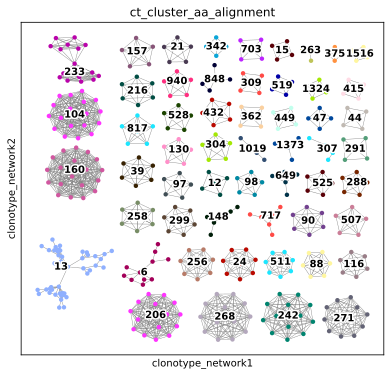

In [21]:
ir.pl.clonotype_network(
    adata,
    color="ct_cluster_aa_alignment",
    legend_fontoutline=3,
    size=80,
    panel_size=(6, 6),
    legend_loc="on data",
)

Now we show the same graph, colored by patient.
We observe that for instance clonotypes 104 and 160 (center-left) are _private_, i.e. they contain cells from
a single sample only. On the other hand, for instance clonotype 233 (top-left) is _public_, i.e.
it is shared across patients _Lung5_ and _Lung1_ and _Lung3_. 

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f427616ec90>],
      dtype=object)

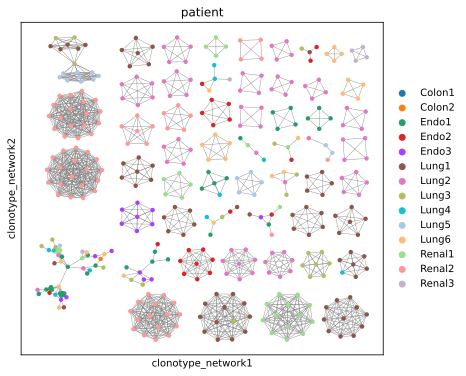

In [22]:
ir.pl.clonotype_network(adata, color="patient", size=80, panel_size=(6, 6))

We can now extract information (e.g. CDR3-sequences) from a specific clonotype cluster by subsetting `AnnData`. 
For instance, we can find out that clonotype `233` does not have a detected alpha chain. 

In [23]:
adata.obs.loc[
    adata.obs["ct_cluster_aa_alignment"] == "233",
    ["TRA_1_cdr3", "TRA_2_cdr3", "TRB_1_cdr3", "TRB_2_cdr3"],
]

,TRA_1_cdr3,TRA_2_cdr3,TRB_1_cdr3,TRB_2_cdr3
LN5_TGGACGCAGCCCAACC-1-7,None,None,CASSFRGTGELFF,None
LN1_CAGAATCGTCGCATCG-1-19,None,None,CASSYQGATEAFF,None
LN1_TCAATCTGTGTGAAAT-1-19,None,None,CASSYQGATEAFF,None
LT3_ACTTGTTTCGCATGAT-1-15,None,None,CASSYQGAGELFF,None
LN3_TTAGGACGTAAGAGAG-1-11,None,None,CASSYQGSTEAFF,None
LN5_AGACGTTAGTGAATTG-1-7,None,None,CASSFRGTGELFF,None
LN5_GTAGTCAGTCCGAAGA-1-7,None,None,CASSFRGTGELFF,None
LN5_ACTGAGTAGTGCGATG-1-7,None,None,CASSFRGTGELFF,None
LN3_GTCTCGTTCGTACGGC-1-11,None,None,CASSYQGSTEAFF,None
LN5_TTGCCGTTCACATGCA-1-7,None,None,CASSFRGTGELFF,None


### Including the V-gene in clonotype definition

In [24]:
ir.tl.define_clonotype_clusters(
    adata,
    sequence="aa",
    metric="alignment",
    same_v_gene="primary_only",
    key_added="ct_cluster_aa_alignment_same_v",
)

In [25]:
# find clonotypes with more than one `clonotype_same_v`
ct_different_v = adata.obs.groupby("ct_cluster_aa_alignment").apply(
    lambda x: x["ct_cluster_aa_alignment_same_v"].unique().size > 1
)
ct_different_v = ct_different_v[ct_different_v].index.values
ct_different_v

[6, 12, 13, 90, 95, ..., 1507, 1518, 1814, 1857, 1860]
Length: 57
Categories (2396, object): [0, 1, 2, 3, ..., 2392, 2393, 2394, 2395]

In [26]:
# Display the first 2 clonotypes with different v genes
adata.obs.loc[
    adata.obs["ct_cluster_aa_alignment"].isin(ct_different_v[:2]),
    ["ct_cluster_aa_alignment", "ct_cluster_aa_alignment_same_v", "TRA_1_v_gene", "TRB_1_v_gene"],
].sort_values("ct_cluster_aa_alignment").drop_duplicates().reset_index(drop=True)

,ct_cluster_aa_alignment,ct_cluster_aa_alignment_same_v,TRA_1_v_gene,TRB_1_v_gene
0,6,6_None_TRBV4-2,None,TRBV4-2
1,6,6_None_TRBV5-4,None,TRBV5-4
2,6,6_None_TRBV5-8,None,TRBV5-8
3,6,6_None_TRBV4-1,None,TRBV4-1
4,6,6_None_TRBV12-4,None,TRBV12-4
5,6,6_None_TRBV5-1,None,TRBV5-1
6,6,6_None_TRBV7-9,None,TRBV7-9
7,6,6_None_TRBV11-2,None,TRBV11-2
8,6,6_None_TRBV10-2,None,TRBV10-2
9,12,12_None_TRBV6-5,None,TRBV6-5


## Clonotype analysis

### Clonal expansion

In [27]:
ir.tl.clonal_expansion(adata)

`clonal_expansion` refers to expansion categories, i.e singleton clonotypes, clonotypes with 2 cells and more than 2 cells. 
The `clonotype_size` refers to the absolute number of cells in a clonotype. 

... storing 'ct_cluster_aa_alignment_same_v' as categorical


... storing 'clonal_expansion' as categorical


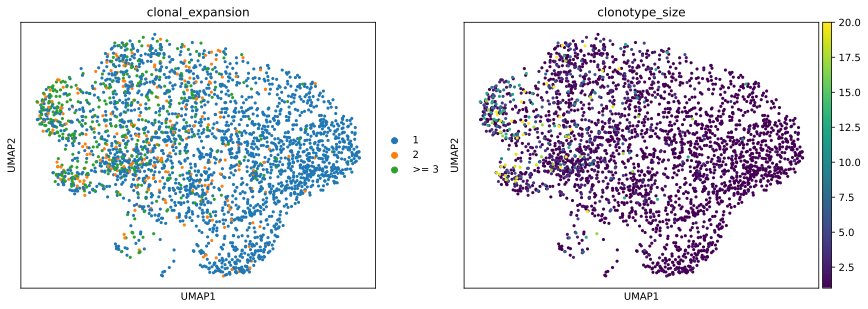

In [28]:
sc.pl.umap(adata, color=["clonal_expansion", "clonotype_size"])

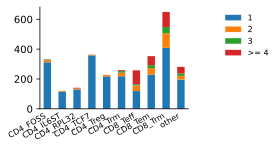

In [29]:
ir.pl.clonal_expansion(adata, groupby="cluster", clip_at=4, normalize=False)

The same plot, normalized to cluster size. Clonal expansion is a sign of positive selection
for a certain, reactive T-cell clone. It, therefore, makes sense that CD8+ effector T-cells 
have the largest fraction of expanded clonotypes. 

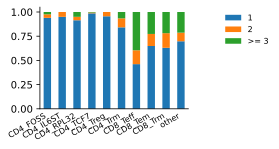

In [30]:
ir.pl.clonal_expansion(adata, "cluster")

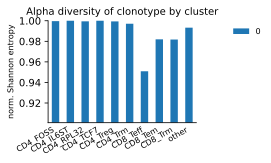

In [31]:
ax = ir.pl.alpha_diversity(adata, groupby="cluster")

### Clonotype abundance

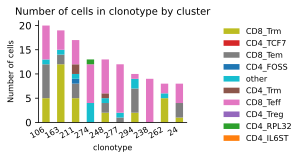

In [32]:
ir.pl.group_abundance(adata, groupby="clonotype", target_col="cluster", max_cols=10)

It might be beneficial to normalize the counts
to the number of cells per sample to mitigate biases due to different sample sizes: 

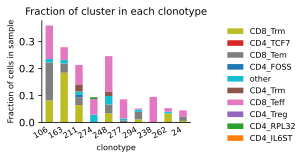

In [33]:
ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="cluster", max_cols=10, normalize="sample"
)

Coloring the bars by patient gives us information about public and private clonotypes: 
Some clonotypes are *private*, i.e. specific to a certain tissue, 
others are *public*, i.e. they are shared across different tissues. 

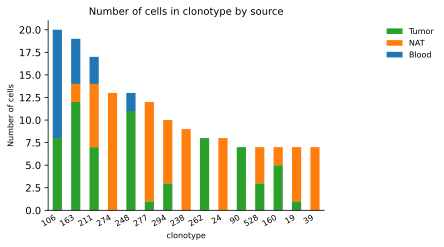

In [34]:
ax = ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="source", max_cols=15, fig_kws={"dpi": 100}
)

However, clonotypes that are shared between *patients* are rare: 

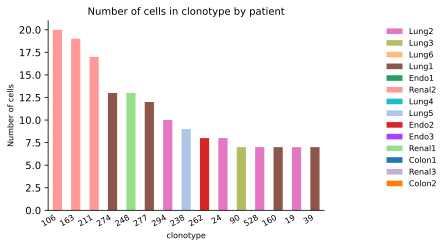

In [35]:
ax = ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="patient", max_cols=15, fig_kws={"dpi": 100}
)

## Gene usage

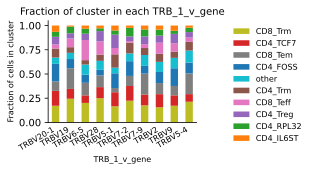

In [36]:
ir.pl.group_abundance(
    adata, groupby="TRB_1_v_gene", target_col="cluster", normalize=True, max_cols=10
)

We can pre-select groups by filtering `adata`:

Trying to set attribute `.uns` of view, copying.


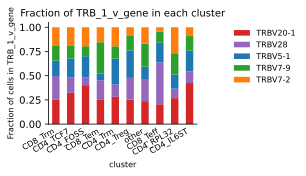

In [37]:
ir.pl.group_abundance(
    adata[
        adata.obs["TRB_1_v_gene"].isin(
            ["TRBV20-1", "TRBV7-2", "TRBV28", "TRBV5-1", "TRBV7-9"]
        ),
        :,
    ],
    groupby="cluster",
    target_col="TRB_1_v_gene",
    normalize=True,
)

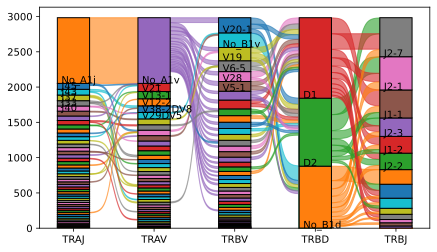

In [38]:
ir.pl.vdj_usage(adata, full_combination=False, top_n=30)

We can also use this plot to investigate the exact VDJ composition of one (or several) clonotypes: 

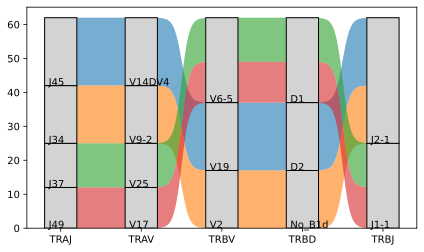

In [39]:
ir.pl.vdj_usage(
    adata[adata.obs["clonotype"].isin(["274", "277", "211", "106"]), :], top_n=None
)

### Spectratype plots

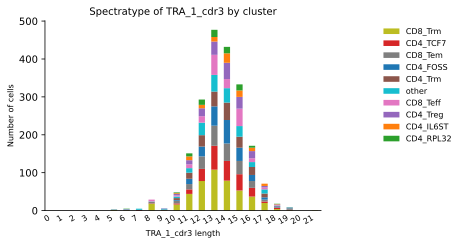

In [40]:
ir.pl.spectratype(adata, color="cluster", viztype="bar", fig_kws={"dpi": 120})

The same chart visualized as "ridge"-plot: 

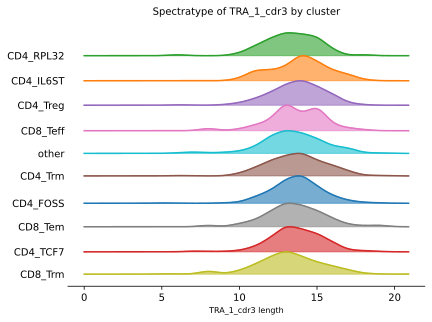

In [41]:
ir.pl.spectratype(
    adata,
    color="cluster",
    viztype="curve",
    curve_layout="shifted",
    fig_kws={"dpi": 120},
    kde_kws={"kde_norm": False},
)

A spectratype-plot by gene usage. To pre-select specific genes, we can simply filter the `adata` object before plotting. 

Trying to set attribute `.uns` of view, copying.


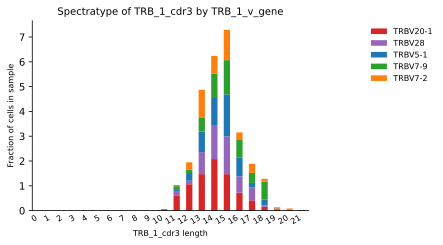

In [42]:
ir.pl.spectratype(
    adata[
        adata.obs["TRB_1_v_gene"].isin(
            ["TRBV20-1", "TRBV7-2", "TRBV28", "TRBV5-1", "TRBV7-9"]
        ),
        :,
    ],
    cdr3_col="TRB_1_cdr3",
    color="TRB_1_v_gene",
    normalize="sample",
    fig_kws={"dpi": 120},
)

## Comparing repertoires

### Repertoire simlarity and overlaps

In [43]:
df, dst, lk = ir.tl.repertoire_overlap(adata, "sample", inplace=False)
df.head()

clonotype,0,1,2,3,4,5,6,7,8,9,...,2505,2506,2507,2508,2509,2510,2511,2512,2513,2514
sample,,,,,,,,,,,,,,,,,,,,,
CN1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
CN2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CT1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CT2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
EN1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


The distance matrix can be shown as a heatmap, while samples are reordered based on hierarchical clustering.

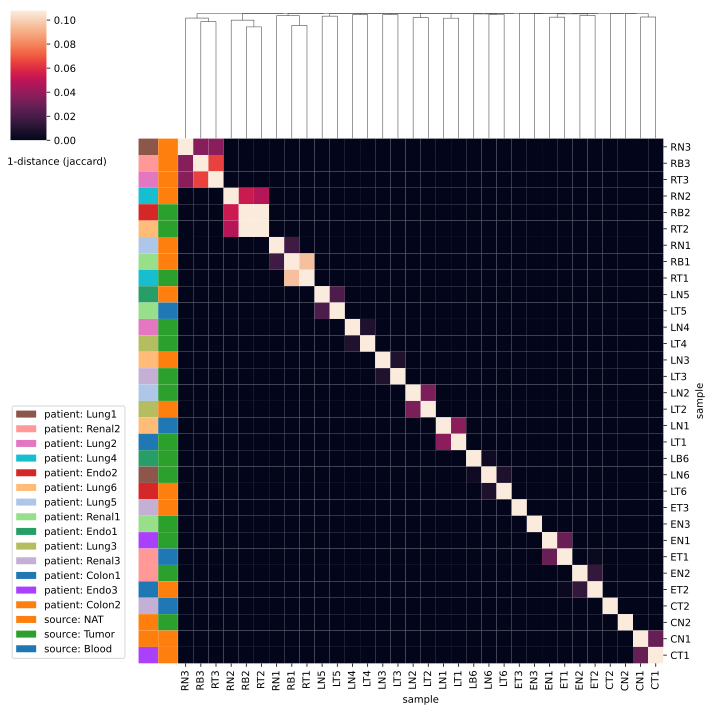

In [44]:
ir.pl.repertoire_overlap(adata, "sample", heatmap_cats=["patient", "source"])

A specific pair of samples can be compared on a scatterplot, where dot size corresponds to the number of clonotypes at a given coordinate.

No handles with labels found to put in legend.


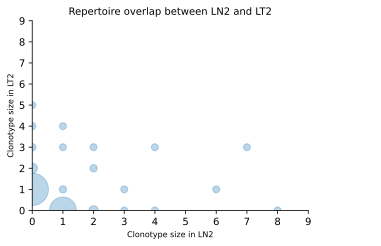

In [45]:
ir.pl.repertoire_overlap(adata, "sample", pair_to_plot=["LN2", "LT2"],fig_kws={"dpi": 120})

### Clonotypes preferentially occuring in a group

A possible grouping criterion could be Tumor vs. Control, separately for distinct tumor types. The site of the tumor that can be extracted from patient metadata.

In [46]:
adata.obs["site"] = adata.obs["patient"].str.slice(stop=-1)

../../scirpy/_tools/_clonotype_imbalance.py:274: RuntimeWarning: divide by zero encountered in log2
  (case_mean_freq + global_minimum) / (control_mean_freq + global_minimum)
../../scirpy/_tools/_clonotype_imbalance.py:274: RuntimeWarning: divide by zero encountered in double_scalars
  (case_mean_freq + global_minimum) / (control_mean_freq + global_minimum)


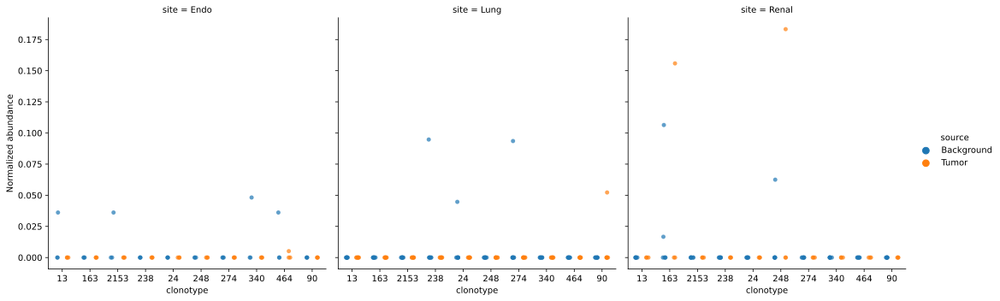

In [47]:
ir.pl.clonotype_imbalance(
    adata,
    replicate_col="sample",
    groupby="source",
    case_label="Tumor",
    additional_hue="site",
    plot_type="strip",
)

To get an idea how the above, top-ranked clonotypes compare to the bulk of all clonotypes, a Volcano plot is genereated, showing the `-log10 p-value` of the Fisher's test as a function of `log2(fold-change)` of the normalized proportion of a given clonotype in the test group compared to the control group. To avoid zero division, `0.01*(global minimum proportion)` was added to every normalized clonotype proportions.

No handles with labels found to put in legend.


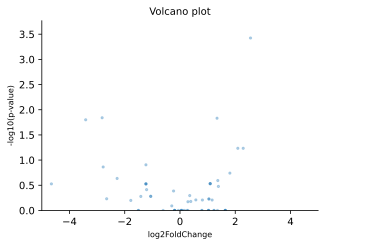

In [48]:
ir.pl.clonotype_imbalance(
    adata,
    replicate_col="sample",
    groupby="source",
    case_label="Tumor",
    additional_hue="diagnosis",
    plot_type="volcano",
    fig_kws={"dpi": 120},
)

## Integrating gene expression
### Clonotype imbalance among cell clusters

Leveraging the opportunity offered by close integeration with scanpy, transcriptomics-based data can be utilized directly. As an example, using cell type annotation inferred from gene expression clusters, clonotypes belonging to CD4+ and CD8+ regional memory T-cells can be compared.

In [49]:
freq, stat = ir.tl.clonotype_imbalance(
    adata,
    replicate_col="sample",
    groupby="source",
    case_label="Tumor",
    control_label="Blood",
    additional_hue="cluster",
    inplace = False,
)
top_differential_clonotypes = stat.groupby("clonotype").agg({"logpValue": "max"}).reset_index().sort_values(by="logpValue", ascending=False).head(n=15).clonotype.tolist()

To check how specific these top clonotypes are for individual cell types, a UMAP is straighforward.

... storing 'site' as categorical


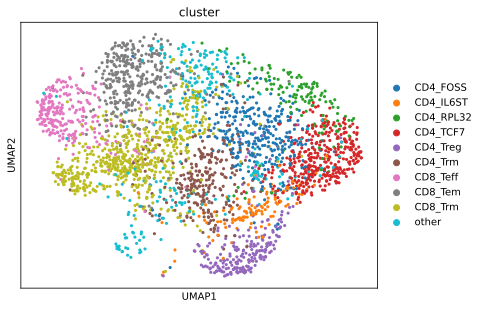

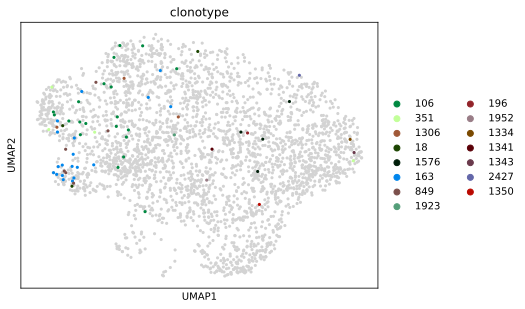

In [50]:
sc.pl.umap(adata, color="cluster")
sc.pl.umap(adata, color="clonotype", groups=top_differential_clonotypes)

### Marker genes in top clonotypes

Gene expression of cells belonging to individual clonotypes can be compared using Scanpy's functionality. As an example, ranking of potential marker genes for top clonotype clusters is showed.

ranking genes


    consider 'clonotype' groups:


    with sizes: [20 19 17 13 13 12 10  9  8  8]


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


         Falling back to preprocessing with `sc.pp.pca` and default params.


computing PCA


    with n_comps=50


    finished (0:00:02)


Storing dendrogram info using `.uns['dendrogram_sample']`


categories: CN1, CN2, CT1, etc.
var_group_labels: 106, 163, 211, etc.


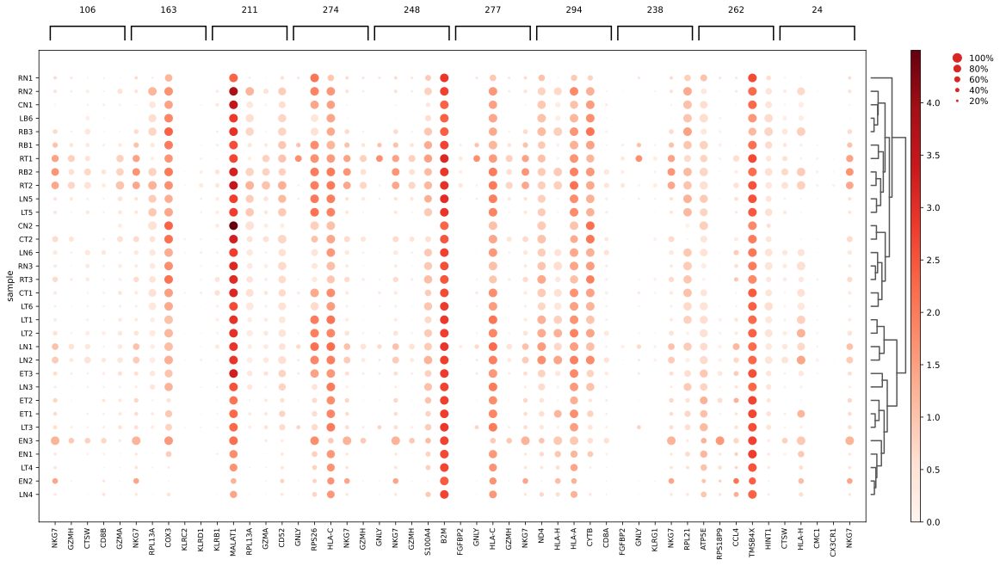

In [51]:
top_clonotype_clusters = ir.tl.group_abundance(adata, groupby="clonotype", target_col="site").head(n=10).index.values.tolist()

sc.tl.rank_genes_groups(adata, "clonotype", groups=top_clonotype_clusters, method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata, groups=top_clonotype_clusters, groupby="sample", n_genes=5)